<a href="https://colab.research.google.com/github/nmhlog/SarimiIsidua/blob/main/lab04/Lab04_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!wget -N https://gist.githubusercontent.com/nmhlog/b42c7d574a3fcfcdc389c1dc2a363f4f/raw/b3882c91f816c7833f501e9190b1ba7d78c65ef9/helper.py
import helper

--2020-10-21 16:54:05--  https://gist.githubusercontent.com/nmhlog/b42c7d574a3fcfcdc389c1dc2a363f4f/raw/b3882c91f816c7833f501e9190b1ba7d78c65ef9/helper.py
Resolving gist.githubusercontent.com (gist.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to gist.githubusercontent.com (gist.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4495 (4.4K) [text/plain]
Saving to: ‘helper.py’

helper.py           100%[===================>]   4.39K  --.-KB/s    in 0s      

Last-modified header missing -- time-stamps turned off.
2020-10-21 16:54:06 (68.5 MB/s) - ‘helper.py’ saved [4495/4495]



# Percobaan Dulu yes

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from helper import *
from scipy import fftpack as fp
from skimage import io, color, util

In [4]:
lulu_path   = 'https://raw.githubusercontent.com/nmhlog/SarimiIsidua/main/lab04/Lab%204%20-%20Images/Tutorial%20Lab%204%20-%20Images/lulu.jpg'
lulu_sobel_path = 'https://raw.githubusercontent.com/nmhlog/SarimiIsidua/main/lab04/Lab%204%20-%20Images/Tutorial%20Lab%204%20-%20Images/lulu_sobel.jpg'
galaxy_path = 'https://raw.githubusercontent.com/nmhlog/SarimiIsidua/main/lab04/Lab%204%20-%20Images/Tutorial%20Lab%204%20-%20Images/galaxy.png'
flower_path = 'https://raw.githubusercontent.com/nmhlog/SarimiIsidua/main/lab04/Lab%204%20-%20Images/Tutorial%20Lab%204%20-%20Images/flower.jpg'

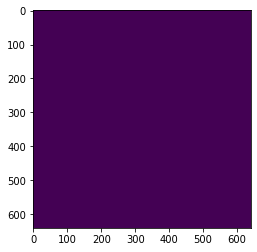

In [5]:
lulu = color.rgb2gray(io.imread(lulu_path))
# Calculate DFT
# ft contains imaginary and real numbers
ft = fp.fft2(lulu)
# plt.imshow(ft)
# Calculate magnitude of imaginary and real numbers
ft_norm = abs(ft)

plt.imshow(ft_norm)

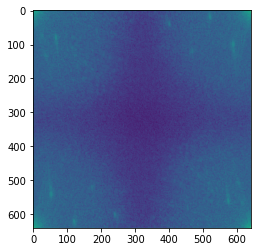

In [6]:
# Scele image
ft_scale = np.log(1+ft_norm)

plt.imshow(ft_scale)

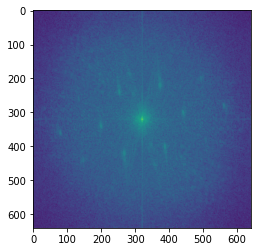

In [7]:
ft_shift = fp.fftshift(ft_scale)

plt.imshow(ft_shift)

In [8]:
ift_real = fp.ifft2(ft).real
ift_noreal = fp.ifft2(ft)

Text(0.5, 1.0, 'before')

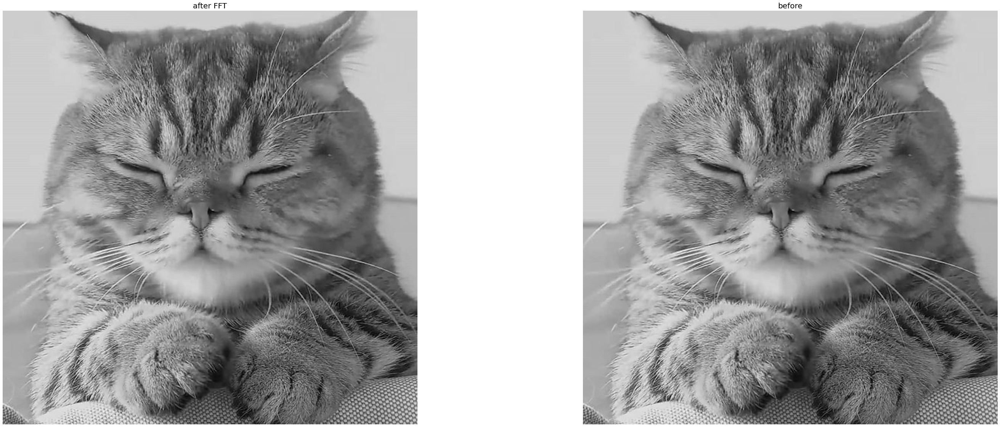

In [9]:
fig,axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))

axs[0].imshow(ift_real,cmap='gray')
axs[0].axis('off')
axs[0].set_title('after FFT',size=20)

axs[1].imshow(lulu,cmap='gray')
axs[1].axis('off')
axs[1].set_title('before',size=20)

<function matplotlib.pyplot.show>

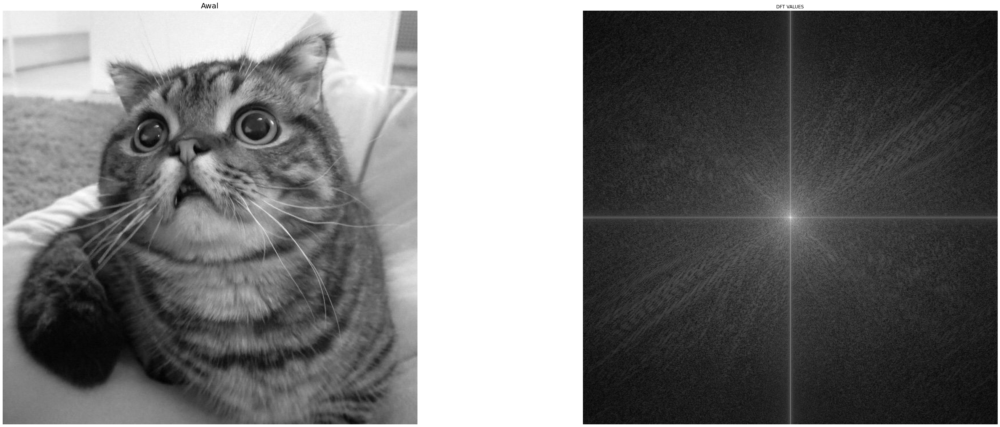

In [10]:
#Load Image 
lulu_sobel = color.rgb2gray(io.imread(lulu_sobel_path))
kern = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
# Get padded image size
w,l = paddedsize(lulu_sobel.shape[0],lulu_sobel.shape[1])
# Calculate DFT
f = fp.fft2(lulu_sobel,(w,l))
h = fp.fft2(kern,(w,l))

# Need to shift and scale to show image
lulu_sobel_norm = abs(f)
# Scale Image 
lulu_sobel_scale = np.log(1+lulu_sobel_norm)
lulu_sobel_shift= fp.fftshift(lulu_sobel_scale)
# Shift low frequency to the center of image

fig,axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))

axs[0].imshow(lulu_sobel,cmap='gray')
axs[0].axis('off')
axs[0].set_title('Awal',size=20)

axs[1].imshow(lulu_sobel_shift,cmap='gray')
axs[1].axis('off')
axs[1].set_title('Hasil',size=20)
plt.title("DFT VALUES")
plt.show

In [11]:
# Load image
i1 = color.rgb2gray(io.imread(galaxy_path))
w, l = paddedsize(i1.shape[0], i1.shape[1])
# Create gaussian lowpass filter
# lpfilter function is provided in helper.py
h = lpfilter('gaussian', w, l, 0.05 * w)
# Calculate DFT
f = fp.fft2(i1,(w,l))
# Apply lowpass filter
LPFS_galaxy = h * f
# Calculate IDFT for spatial domain transformation
LPF_galaxy = fp.ifft2(LPFS_galaxy).real
LPF_galaxy = LPF_galaxy[:i1.shape[0],:i1.shape[1]]
# Shifting for fourier spectrum display
Fc = fp.fftshift(f)
Fcf = fp.fftshift(LPFS_galaxy)
# Scaling for fourier spectrum display
S1 = np.log(1+abs(Fc))
S2 = np.log(1+abs(Fcf))

In [12]:
i1.dtype

dtype('float64')

# 2. Diberikan citra purple.png dengan ukuran 450x300 berikut ini:

(-0.5, 449.5, 299.5, -0.5)

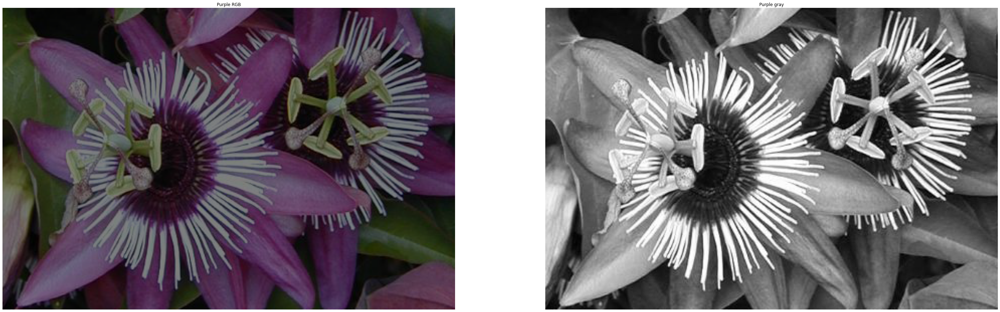

In [13]:
# Hosting image in Github
purple_path = "https://raw.githubusercontent.com/nmhlog/SarimiIsidua/main/lab04/Tugas%20Lab%204%20-%20Images/Tugas%20Lab%204%20-%20Images/purple.png"
purple_img =  io.imread(purple_path)
gray_purple_img = color.rgb2gray(purple_img)

fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(purple_img,cmap="gray");axs[0].set_title("Purple RGB");axs[0].axis("off")
axs[1].imshow(gray_purple_img,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")


# a. Lowpass Filter



In [14]:
# DFT transform,Magnitude,scalling and shifitng

DFT_purple_img = fp.fft2(purple_img)
DFT_gray_purple_img = fp.fft2(purple_img)
mag_DFT_purple_img, mag_DFT_gray_purple_img = abs(DFT_purple_img), abs(DFT_gray_purple_img)

DFT_scale_purple_img = np.log(1+ mag_DFT_purple_img)
DFT_scale_gray_purple_img = np.log(1+ mag_DFT_gray_purple_img)

DFT_shifting_pimg = fp.fftshift(DFT_scale_purple_img)
DFT_shifting__gray_pimg = fp.fftshift(DFT_scale_gray_purple_img)

ift_real_pimg = fp.ifft2(DFT_shifting_pimg).real
ift_real_gray_pimg = fp.ifft2(DFT_shifting__gray_pimg).real



In [15]:
# Color 
wc, lc = paddedsize(purple_img.shape[0], purple_img.shape[1])
wr, lr = paddedsize(purple_img[:,:,0].shape[0], purple_img[:,:,0].shape[1])
wg, lg = paddedsize(purple_img[:,:,1].shape[0], purple_img[:,:,1].shape[1])
wb, lb = paddedsize(purple_img[:,:,2].shape[0], purple_img[:,:,2].shape[1])

# gray
wgry, lgry = paddedsize(gray_purple_img.shape[0], gray_purple_img.shape[1])


## 1. Terapkan Gaussian Lowpass Filter terhadap citra dan tampilkan hasilnya!


In [16]:
# h_ideal = lpfilter('ideal', wc, lc, 0.05 * wc)
# fil_ideal = fp.fft2(purple_img,(wc,lc))
# LPFS_ideal = h_ideal * fil_ideal
# # # Calculate IDFT for Spatial Domain transformation
# LPF_ideal = fp.ifft2(LPFS_ideal).real
# LPF_ideal = LPF_ideal[:purple_img.shape[0],:purple_img.shape[1]]
# # # Shifting for fourier spectrum display
# F_ideal = fp.fftshift(fil_ideal)
# S_F_ideal = np.log(1+abs(F_ideal))
# fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
# # axs[0][0].imshow(LPF_ideal,cmap="gray");axs[0][0].set_title("Purple RGB");axs[0][0].axis("off")
# axs[0].imshow(LPF_ideal,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
# # axs[1][0].imshow(S_F_ideal,cmap="gray");axs[0][0].set_title("Purple RGB");axs[0][0].axis("off")
# axs[1].imshow(S_F_ideal,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")



In [26]:
cat helper.py

"""
helper.py
Contains helper function for image processing in frequency domain.
Includes meshgrid, lowpass filter, highpass filter, notch filter, and paddedsize.

Inherited from Asdos Pengolahan Citra Ganjil 2019/2020
Edited by Asdos Pengolahan Citra Ganjil 2020/2021
"""

import numpy as np

def dftuv(M, N):
    """ DFTUV Computes meshgrid frequency matrices.
    [U, V] = DFTUV(M, N) computes meshgrid frequency matrices U and
    V. U and V are useful for computing frequency-domain filter 
    functions that can be used with DFTFILT. U and V are both M-by-N. """

    # Set up range of variables.
    u = np.arange(M)
    v = np.arange(N)

    # Compute the indices for use in meshgrid
    for i in range(M//2+1, M):
        u[i] = u[i] - M
    for i in range(N//2+1, N):
        v[i] = v[i] - N

    # Return the meshgrid arrays
    return np.meshgrid(v,u)

def lpfilter(tipe, M, N, D0, n = 1): 
    """ LPFILTER Computes frequency domain lowpass filters
    H = LPFILTER(TYPE, M, N, D0, n) c

(-0.5, 899.5, 599.5, -0.5)

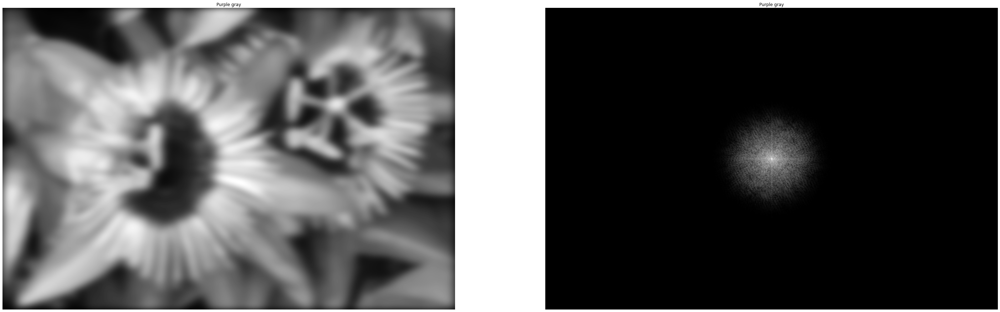

In [22]:
h_ideal_gray = lpfilter('gaussian', wgry, lgry, 0.05 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

In [18]:
# fig, axs = plt.subplots(ncols=2,nrows=2,figsize=(50,20))
# axs[0][0].imshow(LPF_ideal,cmap="gray");axs[0][0].set_title("Purple RGB");axs[0][0].axis("off")
# axs[0][1].imshow(LPF_ideal_gray,cmap="gray");axs[0][1].set_title("Purple gray");axs[0][1].axis("off")
# axs[1][0].imshow(S_F_ideal,cmap="gray");axs[0][0].set_title("Purple RGB");axs[0][0].axis("off")
# axs[1][1].imshow(S_F_ideal_gray,cmap="gray");axs[0][1].set_title("Purple gray");axs[0][1].axis("off")

## 2. Terapkan Ideal Lowpass Filter terhadap citra dan tampilkan hasilnya!


(-0.5, 899.5, 599.5, -0.5)

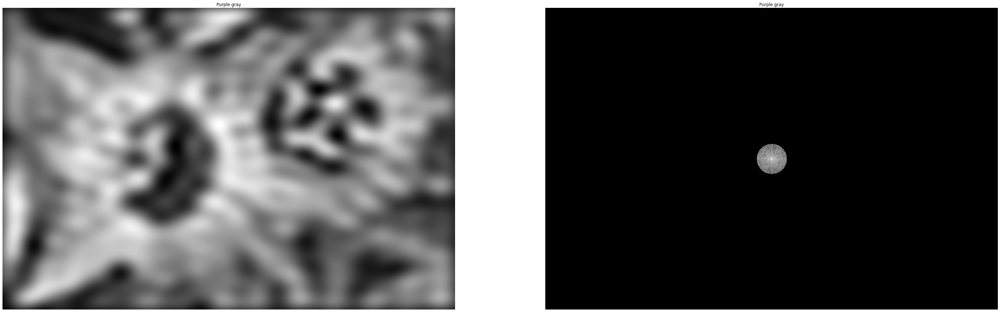

In [30]:
h_ideal_gray = lpfilter('ideal', wgry, lgry, 0.05 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

## 3. Terapkan Butterworth Lowpass Filter terhadap citra dan tampilkan hasilnya!


(-0.5, 899.5, 599.5, -0.5)

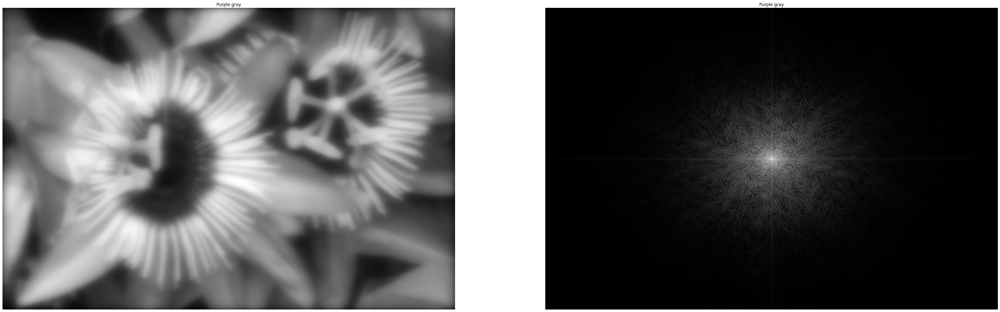

In [24]:
h_ideal_gray = lpfilter('btw', wgry, lgry, 0.05 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

## 4. Tampilkan empat citra pada domain spasial dan frekuensi: citra asli, Gaussian Lowpass Filter , Ideal Lowpass Filter , Butterworth Lowpass filter ! 



### Jelaskan perbedaan dari masing-masing citra tersebut!

# B. Highpass Filter


## 1. Terapkan Gaussian Highpass Filter terhadap citra dan tampilkan hasilnya!

(-0.5, 899.5, 599.5, -0.5)

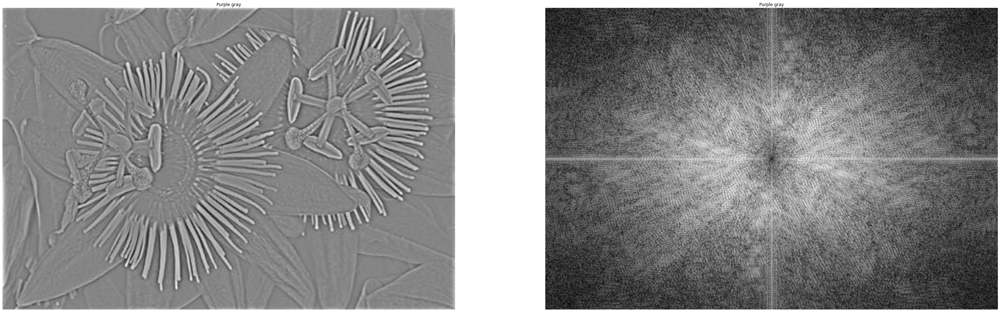

In [33]:
h_ideal_gray = hpfilter('gaussian', wgry, lgry, 0.1 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

## 2. Terapkan Ideal Highpass Filter terhadap citra dan tampilkan hasilnya!

(-0.5, 899.5, 599.5, -0.5)

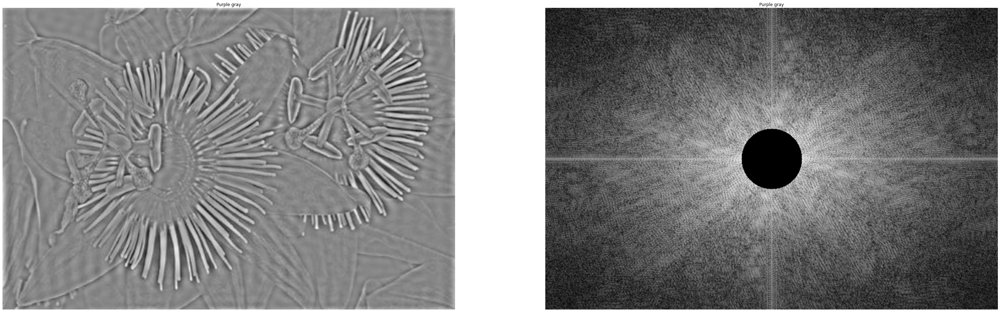

In [34]:
h_ideal_gray = hpfilter('ideal', wgry, lgry, 0.1 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

## 3. Terapkan Butterworth Highpass Filter terhadap citra dan tampilkan hasilnya!


(-0.5, 899.5, 599.5, -0.5)

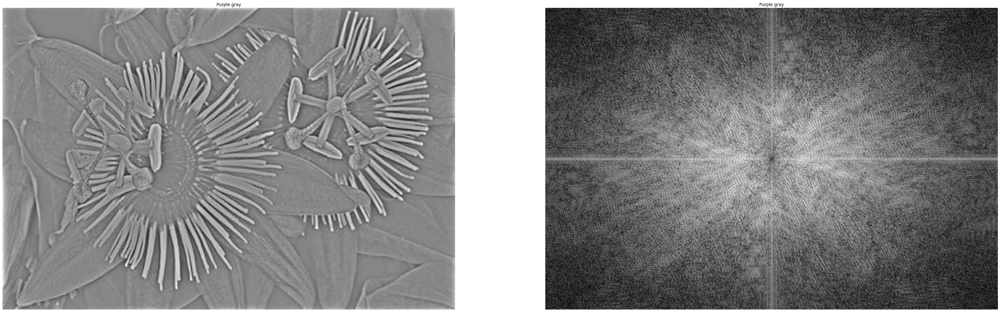

In [35]:
h_ideal_gray = hpfilter('btw', wgry, lgry, 0.1 * wgry)
fil_ideal_gray = fp.fft2(gray_purple_img,(wgry,lgry))
LPFS_ideal_gray = h_ideal_gray * fil_ideal_gray
LPF_ideal_gray = fp.ifft2(LPFS_ideal_gray).real
LPF_ideal_gray = LPF_ideal_gray[:gray_purple_img.shape[0],:gray_purple_img.shape[1]]
F_ideal_gray = fp.fftshift(LPFS_ideal_gray)
S_F_ideal_gray = np.log(1+abs(F_ideal_gray))
fig, axs = plt.subplots(ncols=2,nrows=1,figsize=(50,20))
axs[0].imshow(LPF_ideal_gray,cmap="gray");axs[0].set_title("Purple gray");axs[0].axis("off")
axs[1].imshow(S_F_ideal_gray,cmap="gray");axs[1].set_title("Purple gray");axs[1].axis("off")

## 4. Tampilkan empat citra pada domain spasial dan frekuensi: citra asli, Gaussian Highpass Filter , Ideal Highpass Filter , Butterworth Highpass filter ! 

### Jelaskan perbedaan dari masing-masing citra tersebut!